In [2]:
from imgaug import augmenters as iaa
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [7]:

seq = iaa.Sequential([
    iaa.Crop(px=(0, 16)), # crop images from each side by 0 to 16px (randomly chosen)
    iaa.Fliplr(0.5), # horizontally flip 50% of the images
    iaa.GaussianBlur(sigma=(0, 3.0)) # blur images with a sigma of 0 to 3.0
])


In [20]:
plt.rcParams["figure.figsize"] = (10,10)

In [3]:
img=mpimg.imread('avocado.jpg')

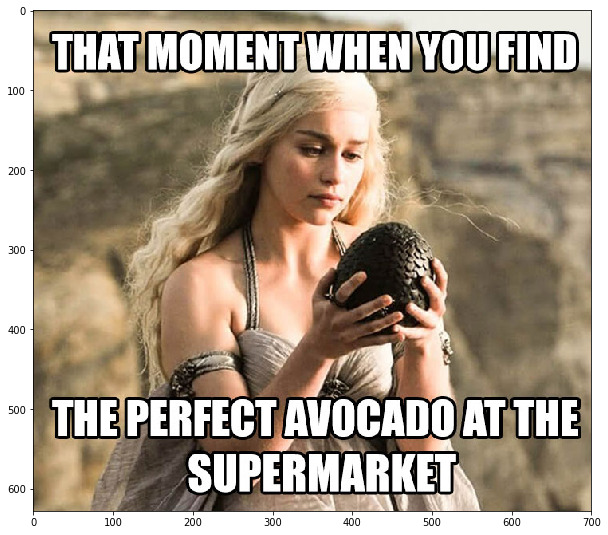

In [21]:
imgplot = plt.imshow(img)

In [25]:
images = [img] * 3

In [8]:
pics = seq.augment_images(images)

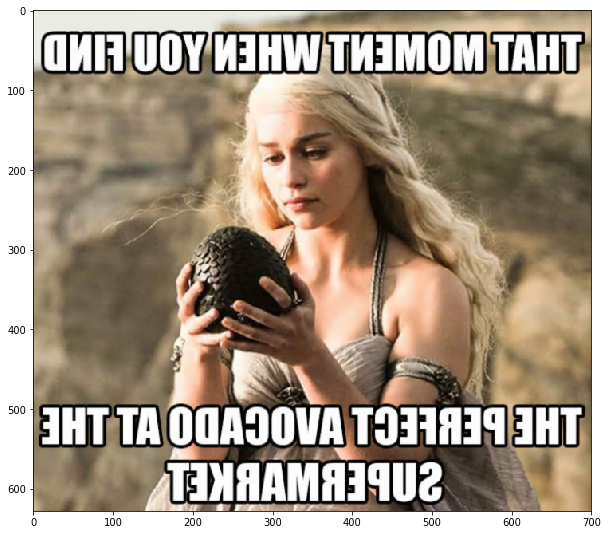

In [22]:
plt.imshow(pics[0])

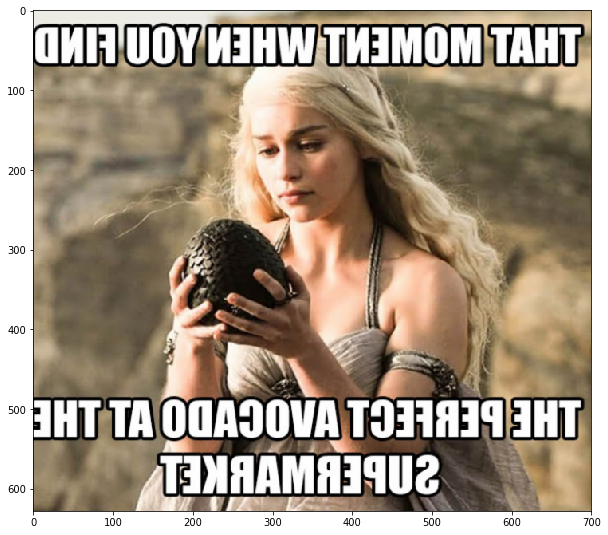

In [23]:
plt.imshow(pics[1])

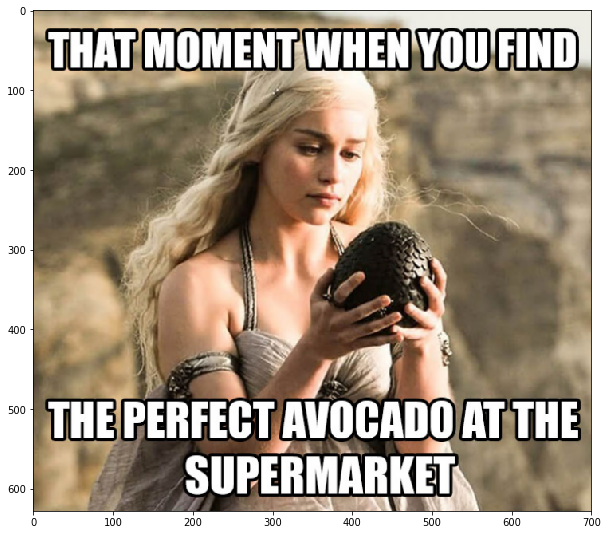

In [24]:
plt.imshow(pics[2])

In [ ]:

for batch_idx in range(1000):
    # 'images' should be either a 4D numpy array of shape (N, height, width, channels)
    # or a list of 3D numpy arrays, each having shape (height, width, channels).
    # Grayscale images must have shape (height, width, 1) each.
    # All images must have numpy's dtype uint8. Values are expected to be in
    # range 0-255.
    images = load_batch(batch_idx)
    images_aug = seq.augment_images(images)
    train_on_images(images_aug)

In [31]:
X_train = np.concatenate([x[np.newaxis, :, :, :] for x in pics], 0)
X_valid = X_train
Y_train = X_train
Y_valid = X_train

In [39]:
print(X_train.shape)

(3, 628, 700, 3)


# load images

In [35]:
from keras.preprocessing.image import ImageDataGenerator

/anaconda/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [92]:
import glob
import skimage.transform
import skimage.io
output_shape = (256, 256)
image_list = []
#for filename in glob.glob('./*.tiff'):
#    img=mpimg.imread(filename)
#    image_list.append(img)
#    print(img.shape)
img_paths = glob.glob('./*.tiff') + glob.glob('./*.tif') + glob.glob('./*.jpg')
X_train = np.array([skimage.transform.resize(skimage.io.imread(path)[:,:,:3], 
        output_shape=output_shape, mode='constant', preserve_range=True) for path in img_paths], dtype=np.uint8)
#X_train = np.concatenate([x[np.newaxis, :, :, :] for x in image_list], 0)
X_valid = X_train
Y_train = X_train
Y_valid = X_train

In [89]:
print(X_train.shape)

(6, 256, 256, 3)


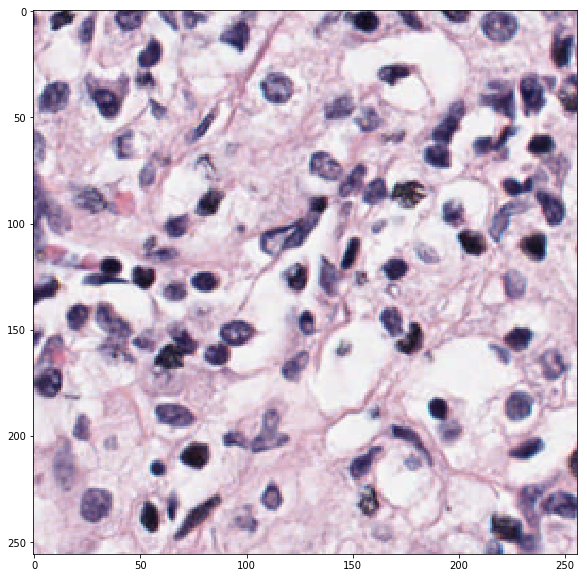

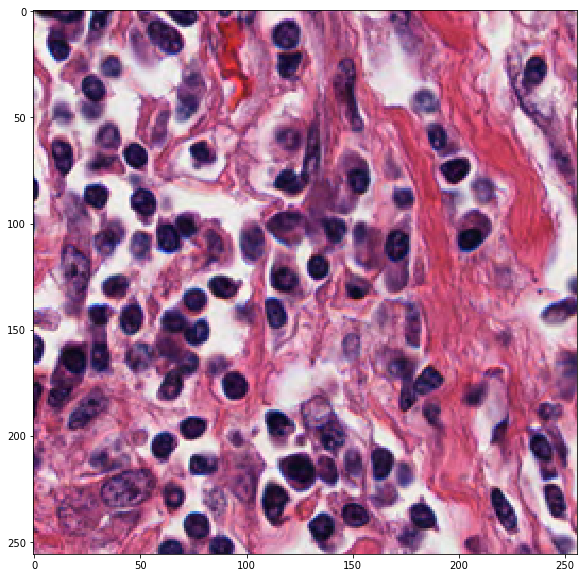

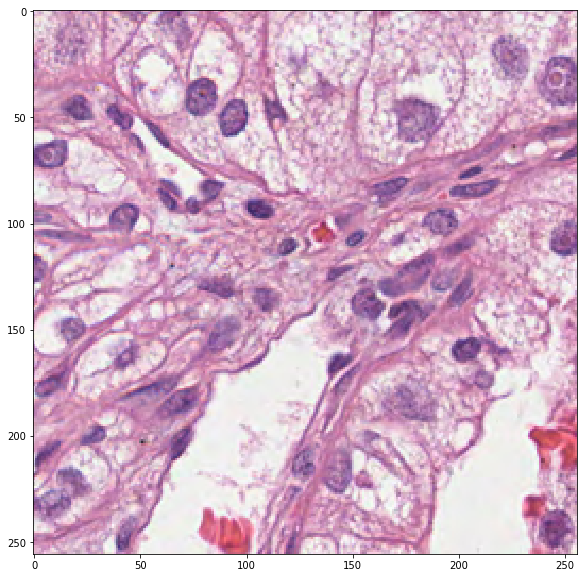

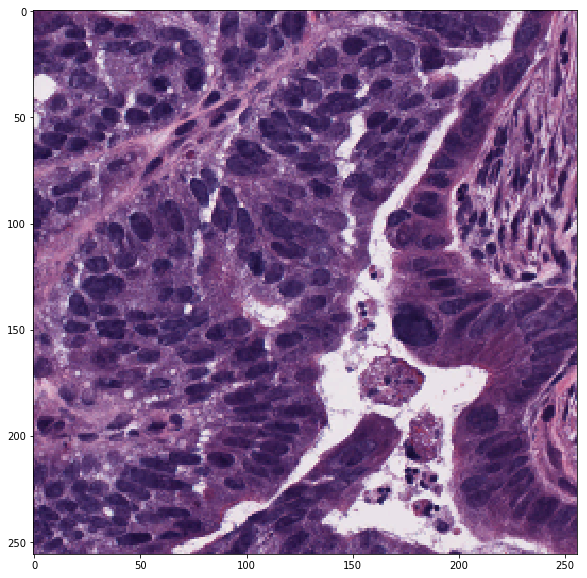

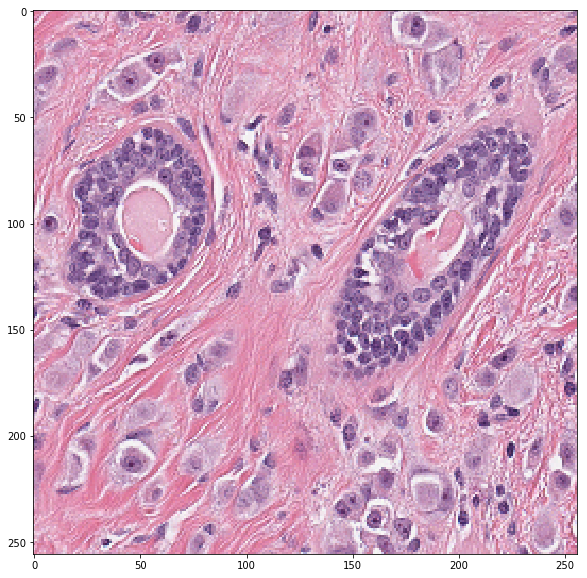

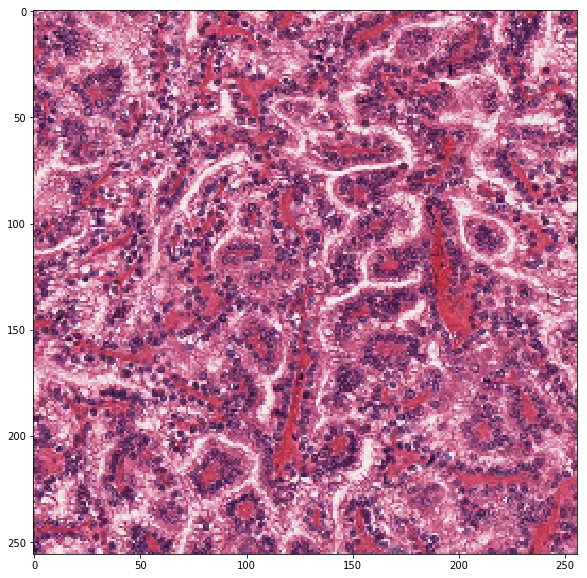

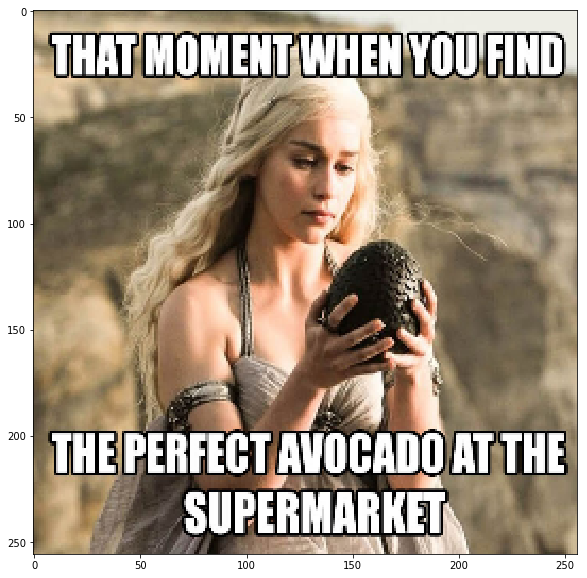

In [99]:
for x in X_train:
    plt.figure()
    plt.imshow(x.astype(np.uint8))
    plt.show()

In [110]:
train_generator, valid_generator = get_train_test_augmented(X_train, Y_train, X_valid, Y_valid)
# then fit generator

2


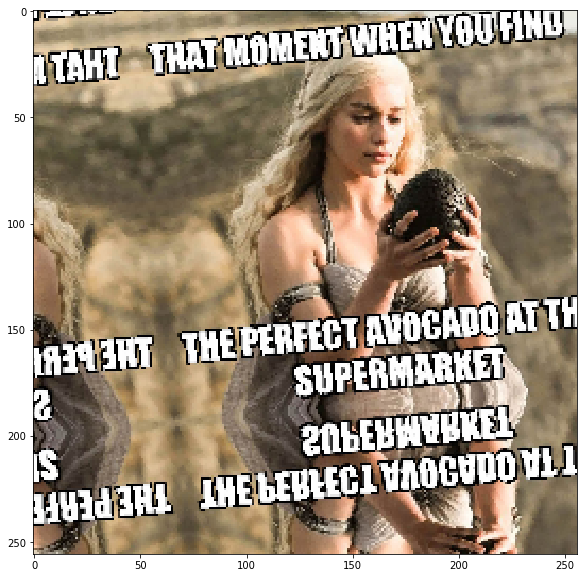

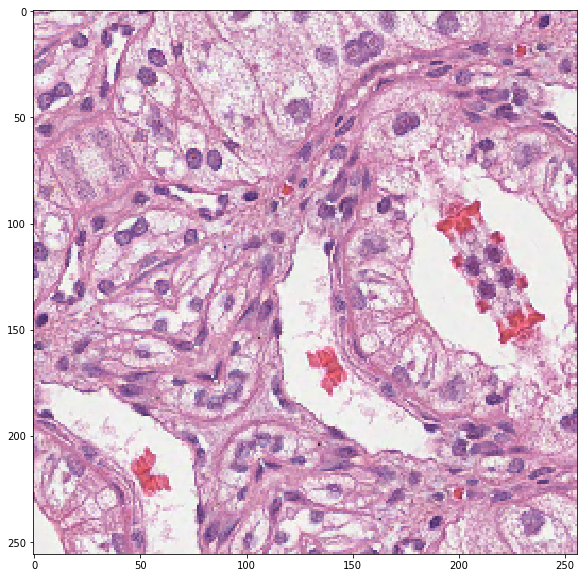

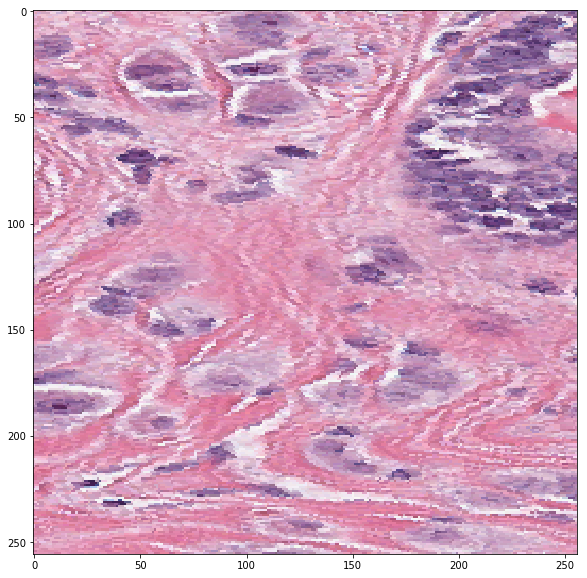

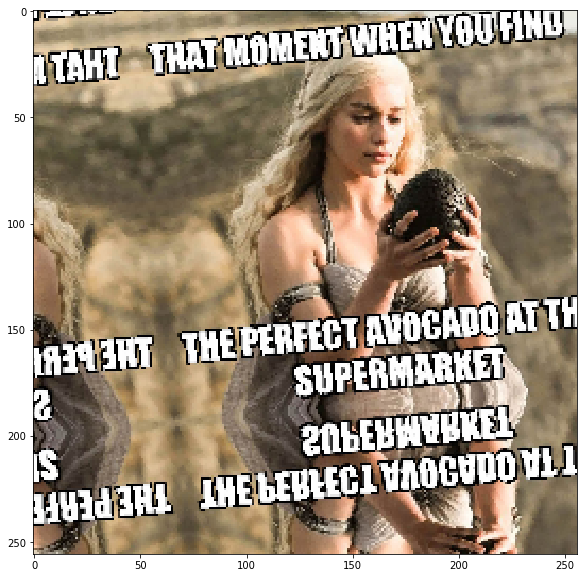

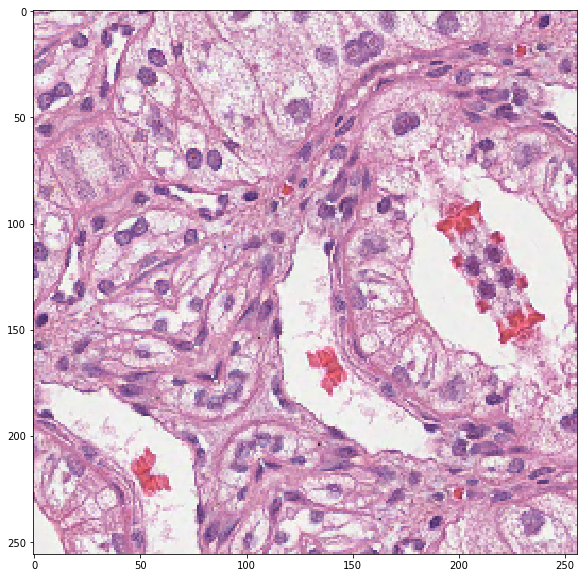

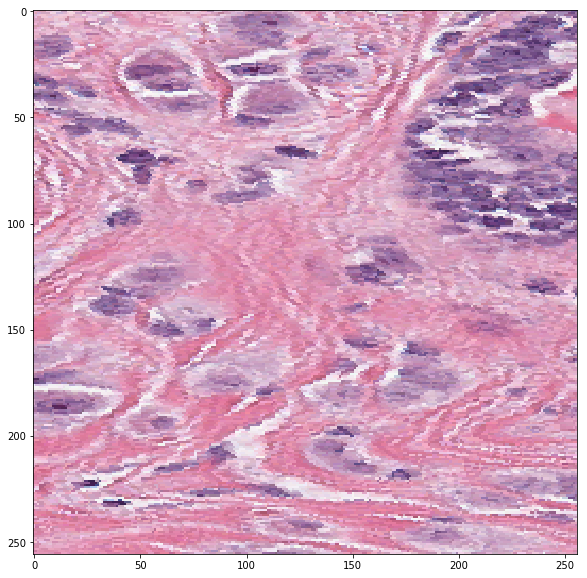

2


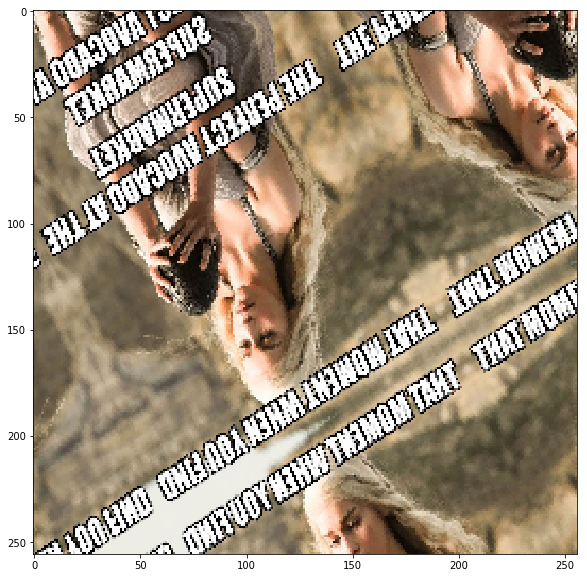

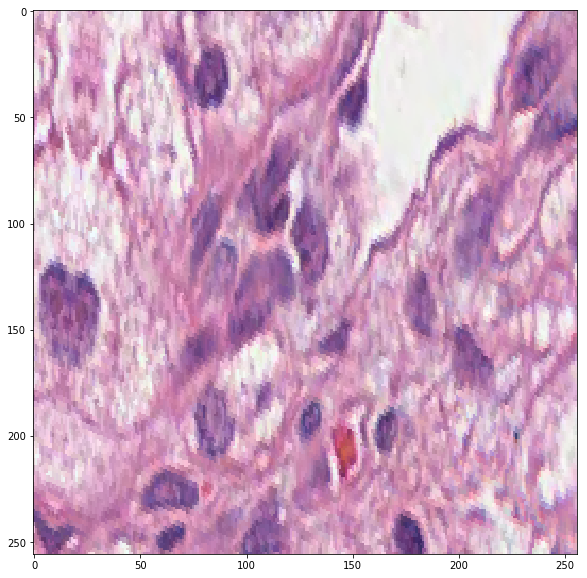

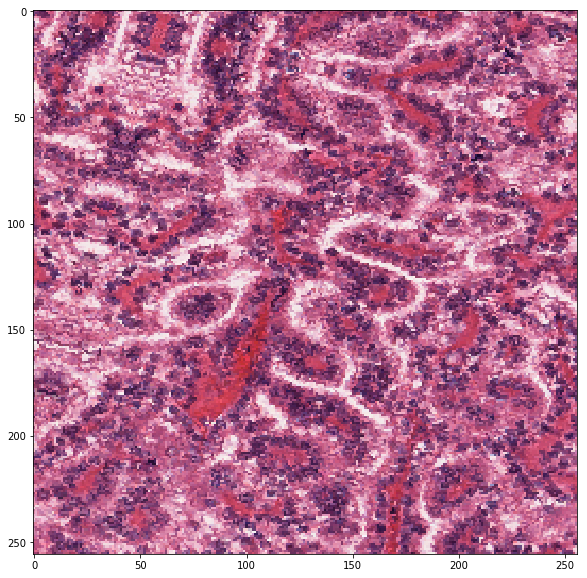

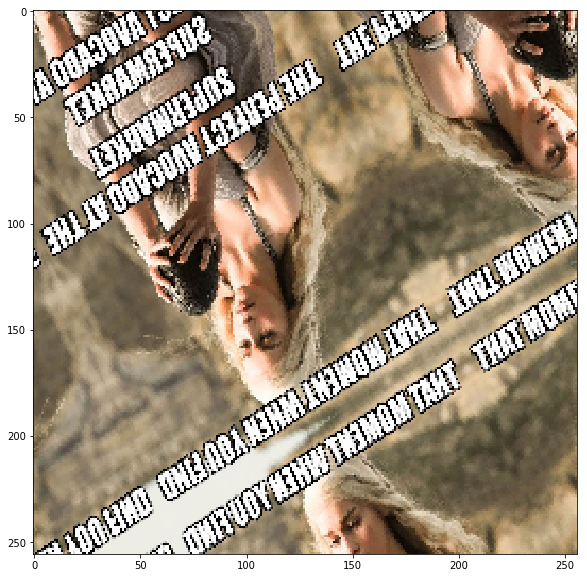

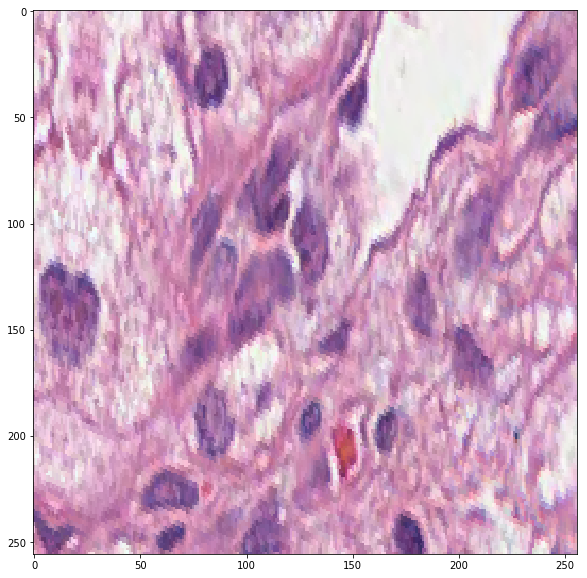

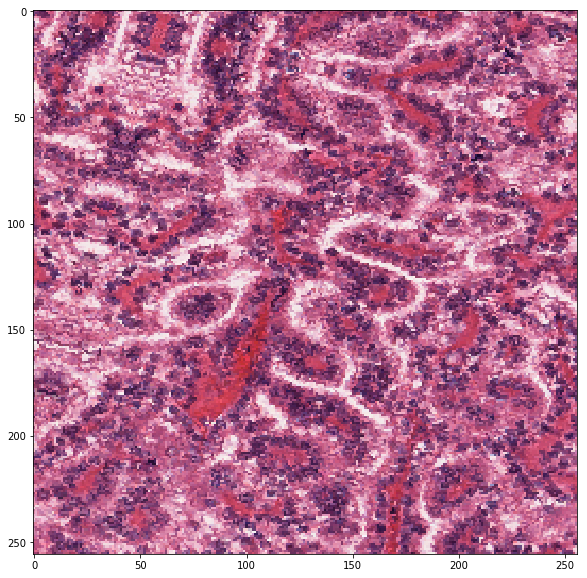

2


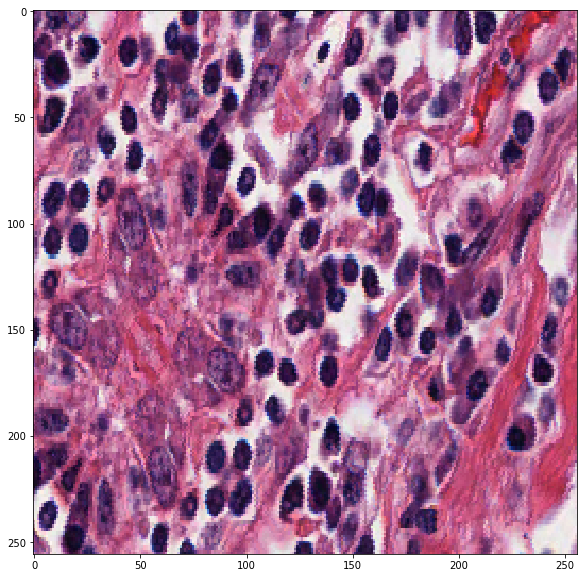

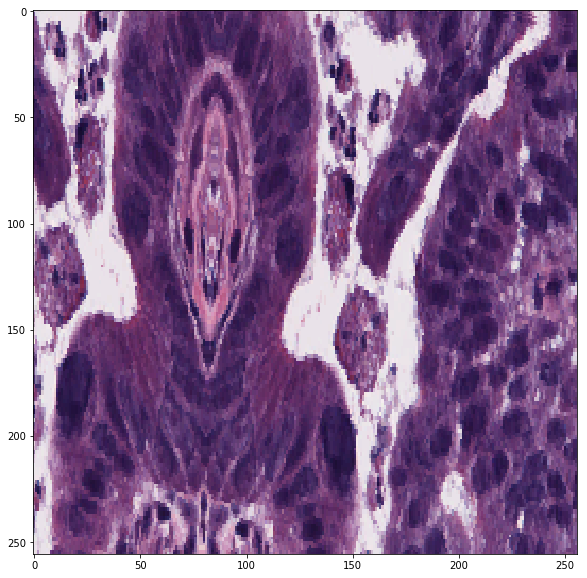

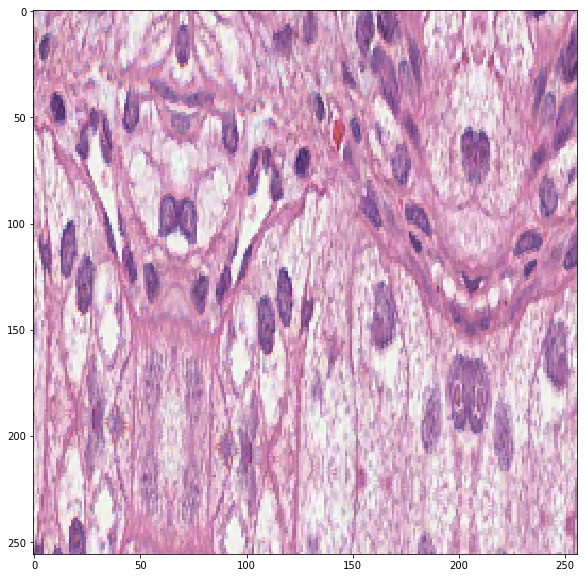

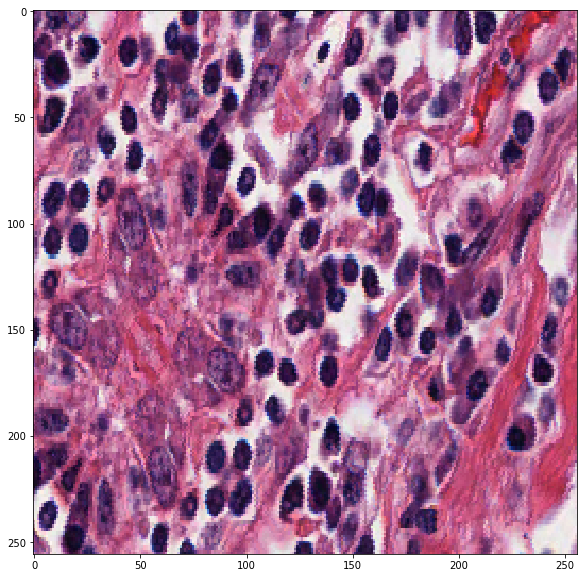

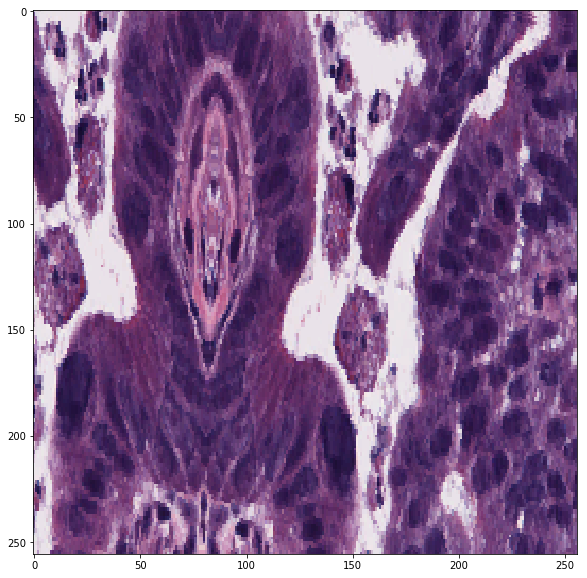

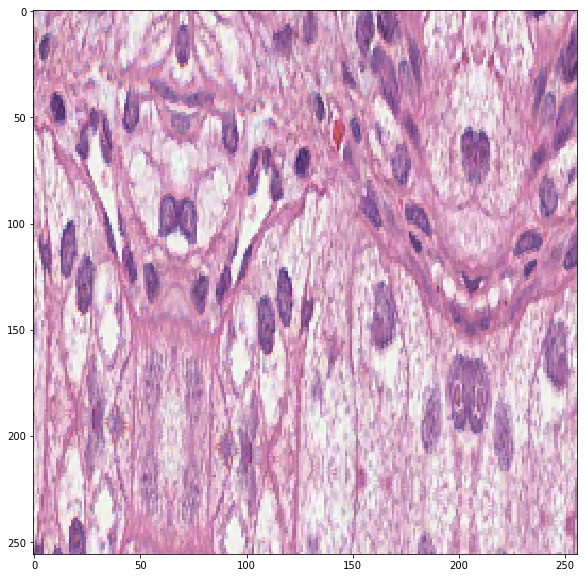

2


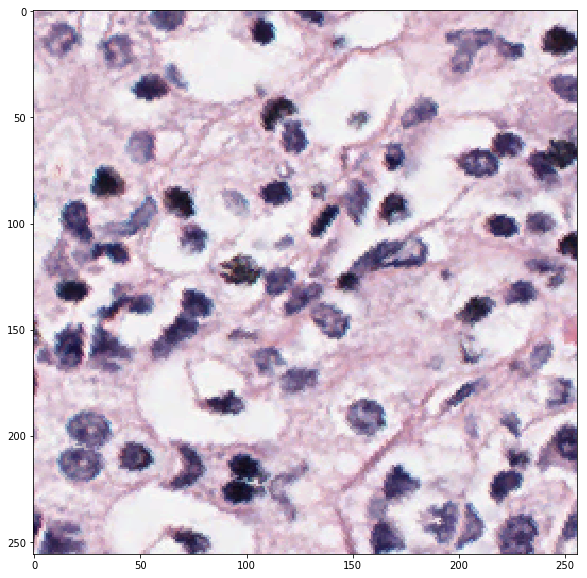

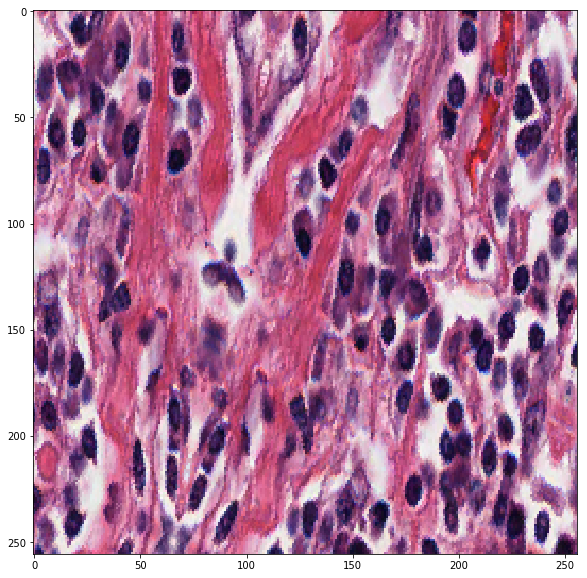

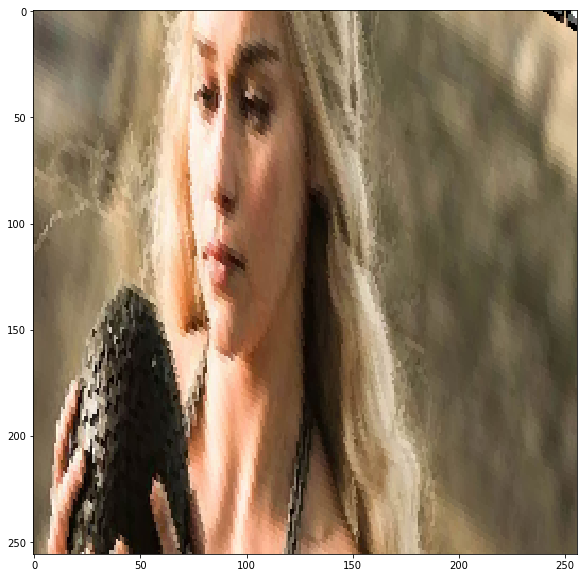

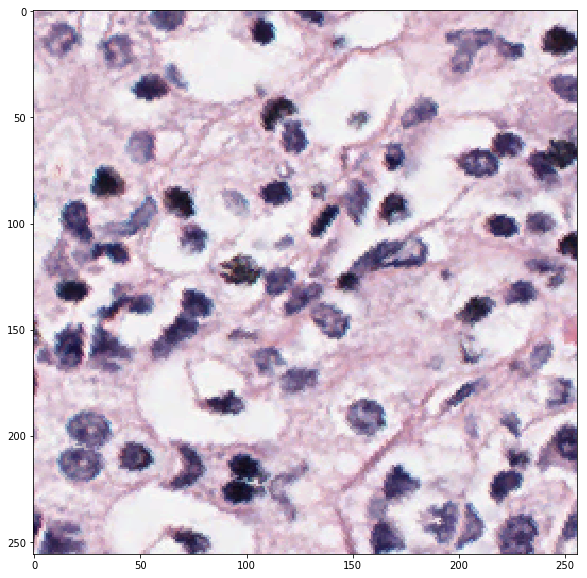

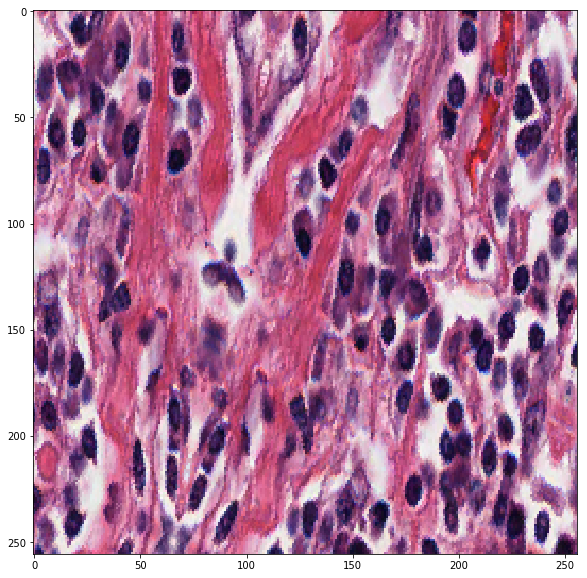

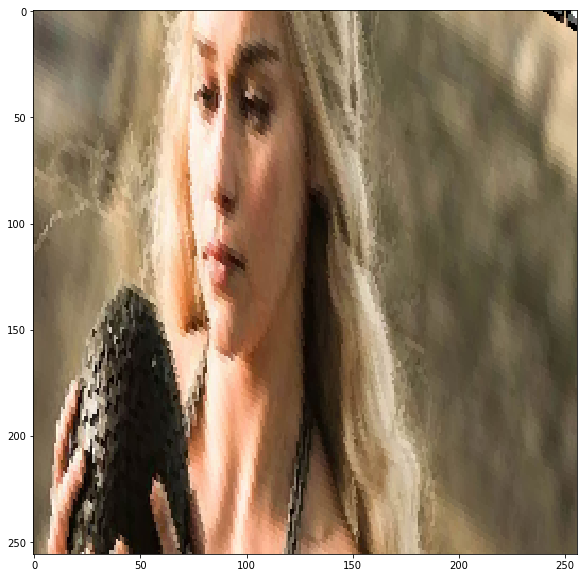

2


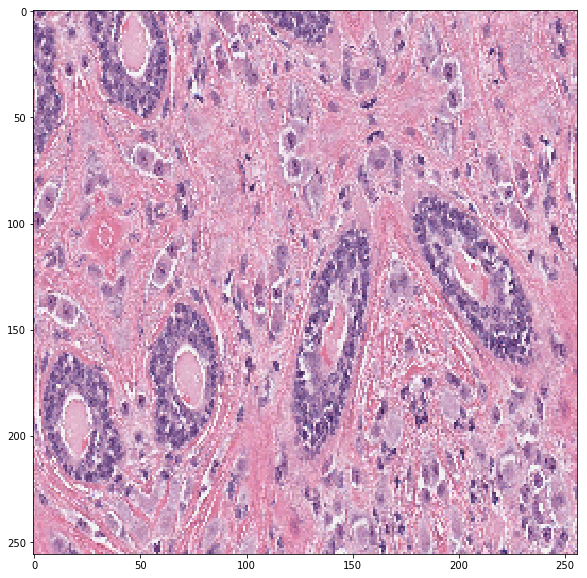

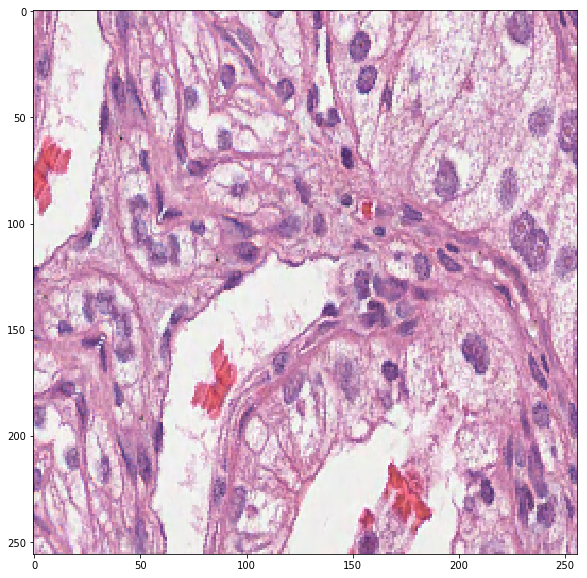

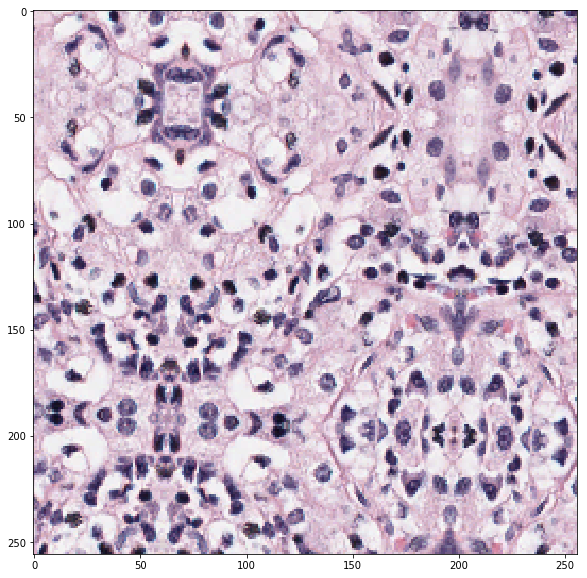

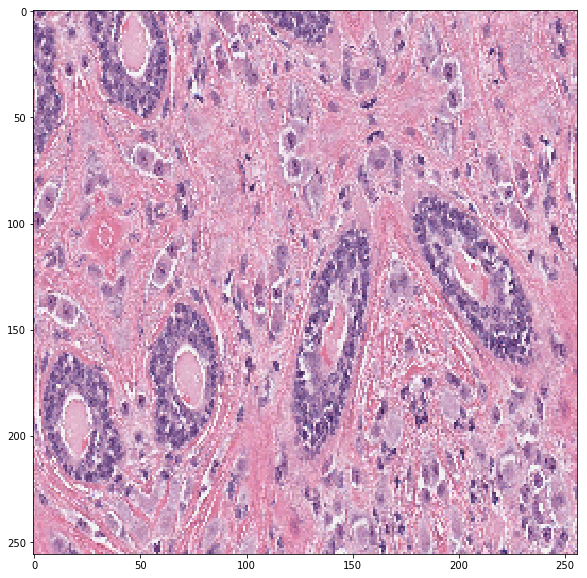

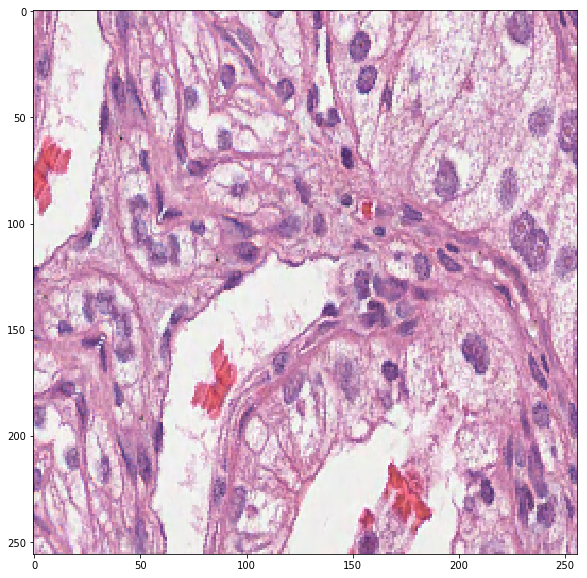

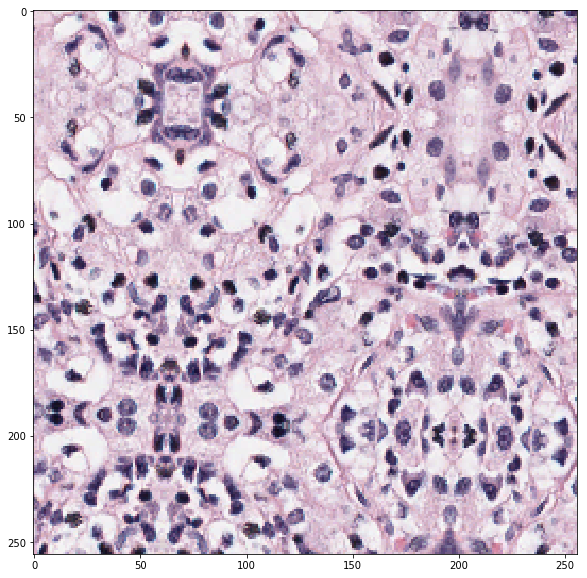

In [111]:
i = 0
import time
for x in train_generator:
    i += 1
    print(len(x))
    for img_id in range(len(x)):
        for it in range(3):
            plt.figure()
            plt.imshow(x[img_id][it].astype(np.uint8))
            plt.show()
    if i == 5:
        break

In [109]:
# Runtime data augmentation
def get_train_test_augmented(X_train, Y_train, X_valid, Y_valid, batch_size=32, seed=1001):
    # Image data generator distortion options
    data_gen_args = dict(rotation_range=45.,
                         width_shift_range=0.3,
                         height_shift_range=0.3,
                         zoom_range=[0.3, 2],
                         horizontal_flip=True,
                         vertical_flip=True,
                         fill_mode='reflect')
    


    # Train data, provide the same seed and keyword arguments to the fit and flow methods
    X_datagen = ImageDataGenerator(**data_gen_args)
    Y_datagen = ImageDataGenerator(**data_gen_args)
    X_datagen.fit(X_train, augment=True, seed=seed)
    Y_datagen.fit(Y_train, augment=True, seed=seed)
    X_train_augmented = X_datagen.flow(X_train, batch_size=batch_size, shuffle=True, seed=seed)
    Y_train_augmented = Y_datagen.flow(Y_train, batch_size=batch_size, shuffle=True, seed=seed)
     
    
    # Validation data, no data augmentation, but create a generator anyway
    X_datagen_val = ImageDataGenerator()
    Y_datagen_val = ImageDataGenerator()
    X_datagen_val.fit(X_valid, augment=True, seed=seed)
    Y_datagen_val.fit(Y_valid, augment=True, seed=seed)
    X_valid_augmented = X_datagen_val.flow(X_valid, batch_size=batch_size, shuffle=True, seed=seed)
    Y_valid_augmented = Y_datagen_val.flow(Y_valid, batch_size=batch_size, shuffle=True, seed=seed)
    
    
    # combine generators into one which yields image and masks
    train_generator = zip(X_train_augmented, Y_train_augmented)
    valid_generator = zip(X_valid_augmented, Y_valid_augmented)
    
    return train_generator, valid_generator